# Vehicle Detection and Tracking
This notebook develops a pipeline for reading a road video and marking all of the vehicles in each frame then rewriting the video so that all of the cars are identified in teh video.

### Imports
These are all of the imports required by the notebook.

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from skimage.feature import hog
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from scipy.ndimage.measurements import label
import glob
import time
import pickle
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from vehic_lib import *
%matplotlib inline

### Vehicle Detection Library
Many of the functions written in the Vehicle Detection Lesson I have combined into a library file, vehic_lib.py, which is imported above.  I have further modified them for my purposes.

### Feature Extraction - Color Histograms
This demonstrates the differences in color histograms for a car, a tree, the road, and sky.  This code is taken from the Vehicle Detection Lesson Part 12 and modified for my purposes.  See writeup.md for full description.

In [3]:
# Define some images for next few cwells
cutout1_image = mpimg.imread('test_images/cutout1.jpg')
cutout2_image = mpimg.imread('test_images/cutout1.jpg')
tree_image = mpimg.imread('test_images/tree.jpg')
road_image = mpimg.imread('test_images/road.jpg')
sky_image = mpimg.imread('test_images/sky.jpg')


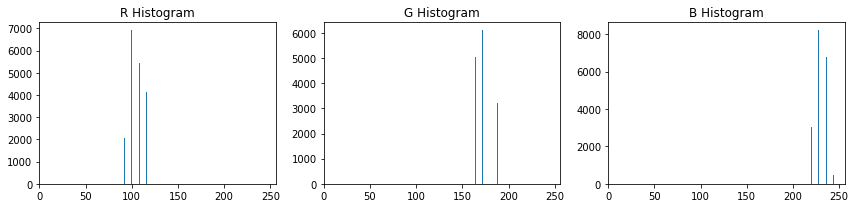

In [75]:
# Define a function to compute color histogram features  
def full_color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the RGB channels separately
    rhist = np.histogram(img[:,:,0], bins=32, range=(0, 256))
    ghist = np.histogram(img[:,:,1], bins=32, range=(0, 256))
    bhist = np.histogram(img[:,:,2], bins=32, range=(0, 256))
    # Generating bin centers
    bin_edges = rhist[1]
    bin_centers = (bin_edges[1:]  + bin_edges[0:len(bin_edges)-1])/2
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((rhist[0], ghist[0], bhist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return rhist, ghist, bhist, bin_centers, hist_features

rh, gh, bh, bincen, feature_vec = full_color_hist(sky_image, nbins=32, bins_range=(0, 256))

# Plot a figure with all three bar charts
if rh is not None:
    fig = plt.figure(figsize=(12,3))
    plt.subplot(131)
    plt.bar(bincen, rh[0])
    plt.xlim(0, 256)
    plt.title('R Histogram')
    plt.subplot(132)
    plt.bar(bincen, gh[0])
    plt.xlim(0, 256)
    plt.title('G Histogram')
    plt.subplot(133)
    plt.bar(bincen, bh[0])
    plt.xlim(0, 256)
    plt.title('B Histogram')
    fig.tight_layout()
    fig.savefig('out_images/hist_rgb_sky.jpg')
else:
    print('Your function is returning None for at least one variable...')

### Feature Extraction - Spatial Binning
This code reduces an image to a smaller dimension for purposes of raw pixel comparison.  The code is taken from Vehicle Detection Lesson Part 16 and is edited for my purposes.  See writeup.md for full discussion.

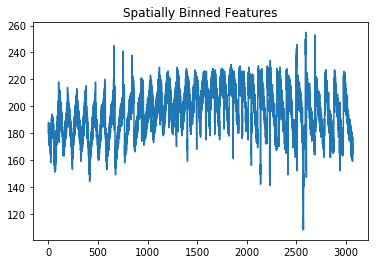

In [82]:
feature_vec = bin_spatial(road_image, size=(32, 32))

# Plot features
fig = plt.figure()
plt.plot(feature_vec)
plt.title('Spatially Binned Features')
fig.savefig('out_images/spat_bin_road.jpg')

### Feature Extraction - Histogram of Oriented Gradients - HOG
This code looks at the gradient of an image.  The code is taken from Vehicle Detection Lesson Part 20 and is edited for my purposes.  See writeup.md for full discussion.

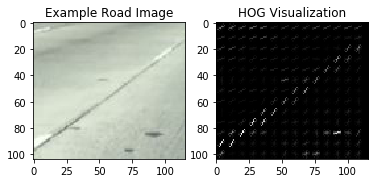

In [16]:
gray = cv2.cvtColor(road_image, cv2.COLOR_RGB2GRAY)
# Define HOG parameters
orient = 9
pix_per_cell = 8
cell_per_block = 2
# Call our function with vis=True to see an image output
features, hog_image = get_hog_features(gray, orient, 
                        pix_per_cell, cell_per_block, 
                        vis=True, feature_vec=False)

# Plot the examples
fig = plt.figure()
plt.subplot(121)
plt.imshow(road_image, cmap='gray')
plt.title('Example Road Image')
plt.subplot(122)
plt.imshow(hog_image, cmap='gray')
plt.title('HOG Visualization')
fig.savefig('out_images/hog_road.jpg')

### Window Search
This code explores sliding window search of a video frame image.  The code is taken from Vehicle Detection Lesson Part 32 and is edited for my purposes.  See writeup.md for full discussion.

Total windows:  166


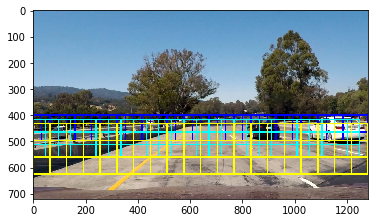

In [28]:
img_num = 1
image = mpimg.imread('test_images/test{0}.jpg'.format(img_num))

window_img = np.copy(image)
count = 0
windows = slide_window(image, x_start_stop=[None, None], y_start_stop=[400, 400+96], 
                       xy_window=(64, 64), xy_overlap=(0.5, 0.5))
window_img = draw_boxes(window_img, windows, color=(0, 0, 255), thick=4) 
count += len(windows)

windows = slide_window(image, x_start_stop=[None, None], y_start_stop=[416, 416+96+48], 
                       xy_window=(96, 96), xy_overlap=(0.5, 0.5))
window_img = draw_boxes(window_img, windows, color=(0, 255, 255), thick=4)
count += len(windows)

windows = slide_window(image, x_start_stop=[None, None], y_start_stop=[432, 432+128+64], 
                       xy_window=(128, 128), xy_overlap=(0.5, 0.5))
window_img = draw_boxes(window_img, windows, color=(255, 255, 0), thick=4)
count += len(windows)

mpimg.imsave('out_images/windows_test{0}.jpg'.format(img_num), window_img)
plt.imshow(window_img)
print('Total windows: ', count)

### Data 
I used all of the png files supplied by the project sourced from GTI and KITTI for training the model.

In [9]:
# Read in cars and notcars
images = glob.glob('*vehicles/*/*.png')
cars = []
notcars = []
for image in images:
    if 'non' in image:
        notcars.append(image)
    else:
        cars.append(image)
print('Num cars: ', len(cars))
print('Num non cars: ', len(notcars))

Num cars:  8792
Num non cars:  8968


### Search and Classify
This code trains a linear SVC model using data from above as input.  The modle can be saved to file for use later. The code is taken from Vehicle Detection Lesson Part 32 and is edited for my purposes. See writeup.md for full discussion.

In [54]:
# Reduce the sample size because
# The quiz evaluator times out after 13s of CPU time
#sample_size = 100
#cars = cars[0:sample_size]
#notcars = notcars[0:sample_size]

### TODO: Tweak these parameters and see how the results change.
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = "ALL" # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

t=time.time()
car_features = extract_features(cars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = extract_features(notcars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to extract features...')

X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()

save = False
model_fn = 'models/model_YCrCb.p'
# Save model to file as dictionary if requested
if save == True:
    print('Saving model to file ', model_fn)
    model = { 'svc': svc, 'X_scaler': X_scaler,
             'color_space': color_space, 'orient': orient, 
             'pix_per_cell': pix_per_cell, 'cell_per_block': cell_per_block,
             'hog_channel': hog_channel, 'spatial_size': spatial_size,
             'hist_bins': hist_bins, 'spatial_feat': spatial_feat,
             'hist_feat': hist_feat, 'hog_feat': hog_feat}
    pickle.dump( model, open( model_fn, "wb" ) )


Num cars:  8792
Num non cars:  8968
92.05 Seconds to extract features...
Using: 9 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 8460
53.11 Seconds to train SVC...
Test Accuracy of SVC =  0.9901
Saving model to file  models/model_HLS.p


### Read Model
This code reads in the model saved above and sets all parameters used for training the model.

In [18]:
model_fn = 'models/model_YCrCb.p'
model = pickle.load( open( model_fn, "rb" ) )
svc = model['svc']
X_scaler = model['X_scaler']
color_space = model['color_space']
orient = model['orient']
pix_per_cell = model['pix_per_cell']
cell_per_block = model['cell_per_block']
hog_channel = model['hog_channel']
spatial_size = model['spatial_size']
hist_bins = model['hist_bins']
spatial_feat = model['spatial_feat']
hist_feat = model['hist_feat']
hog_feat = model['hog_feat']
print('Read in model ', model_fn, ' resetting feature parameters.')
print('color_space', color_space, ' orient', orient, ' pix_per_cell', pix_per_cell, ' cell_per_block',cell_per_block,
     ' hog_channel', hog_channel, ' spatial_size', spatial_size, ' hist_bins', hist_bins, ' spatial_feat', spatial_feat,
     ' hist_feat', hist_feat, ' hog_feat', hog_feat)

Read in model  models/model_YCrCb.p  resetting feature parameters.
color_space YCrCb  orient 9  pix_per_cell 8  cell_per_block 2  hog_channel ALL  spatial_size (32, 32)  hist_bins 32  spatial_feat True  hist_feat True  hog_feat True


### Search Test Images
This code tests the model from above on several test images taken from the projecte video.  The code is taken from Vehicle Detection Lesson Part 32 and is edited for my purposes. See writeup.md for full discussion.

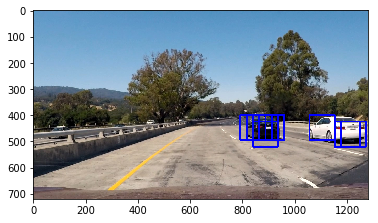

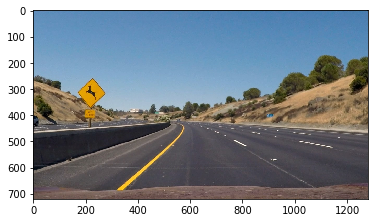

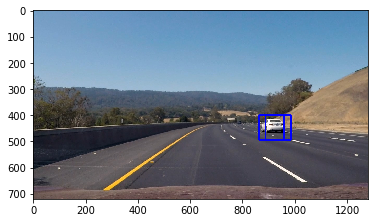

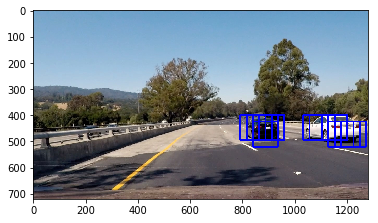

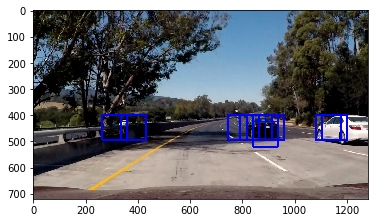

...

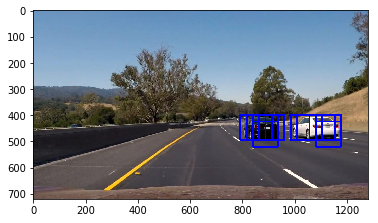

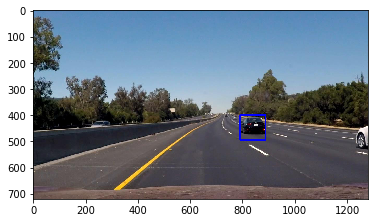

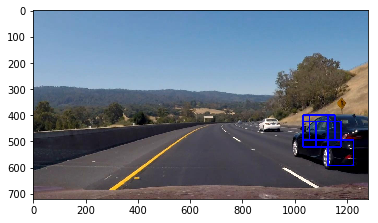

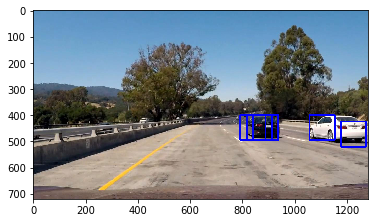

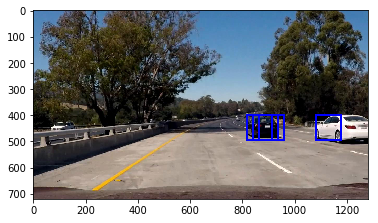

In [68]:
x_start_stop=[None, None]
y_start_stop=[400, 592] 
xy_window=(96, 96)
xy_overlap=(0.75, 0.75)

for i in range(1,14):
    image = mpimg.imread('test_images/test{0}.jpg'.format(i))
    draw_image = np.copy(image)

    # Uncomment the following line if you extracted training
    # data from .png images (scaled 0 to 1 by mpimg) and the
    # image you are searching is a .jpg (scaled 0 to 255)
    image = image.astype(np.float32)/255

    windows = slide_window(image, x_start_stop=x_start_stop, y_start_stop=y_start_stop, 
                        xy_window=xy_window, xy_overlap=xy_overlap)

    hot_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)                       

    window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)                    

    plt.figure()
    plt.imshow(window_img)
    mpimg.imsave('out_images/search_classify_test{0}.jpg'.format(i), window_img)

### HOG Sub-sampling

This code implements an efficient HOG sampling technique.  It uses the model from above.  The code is taken from Vehicle Detection Lesson Part 32 and is edited for my purposes. See writeup.md for full discussion.

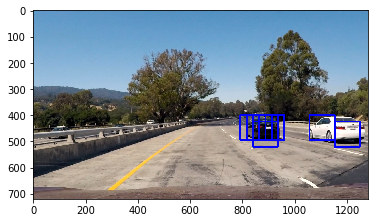

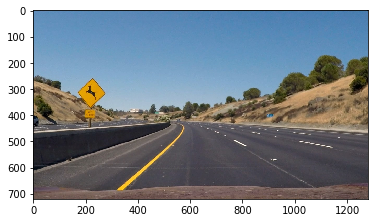

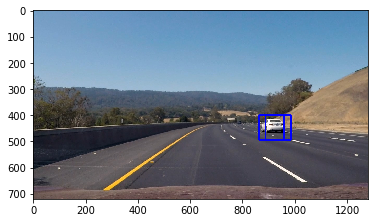

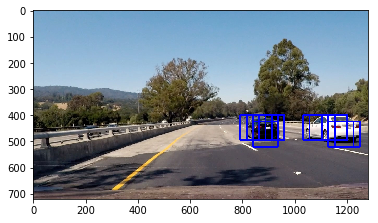

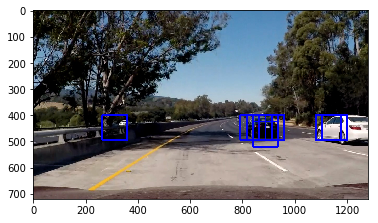

...

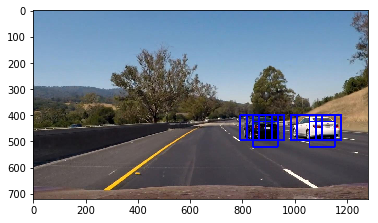

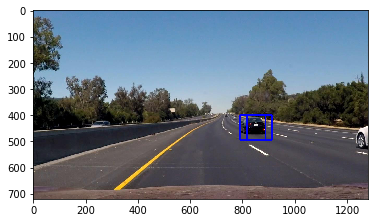

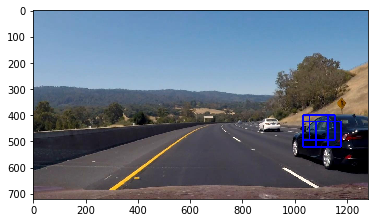

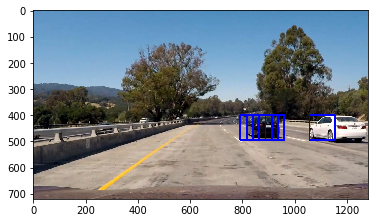

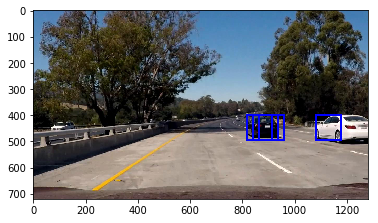

In [19]:
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, vis=False):
    
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    bboxes = []
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                rect = ((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart))
                bboxes.append(rect)
                cv2.rectangle(draw_img,rect[0],rect[1],(0,0,255),6) 
                
    if vis == True:
        return draw_img
    else:
        return bboxes


#img = mpimg.imread('test_images/test4.jpg')

ystart = 400
ystop = 592
scale = 1.5

for i in range(1,14):
    image = mpimg.imread('test_images/test{0}.jpg'.format(i))
    out_img = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, vis=True)
    plt.figure()
    plt.imshow(out_img)
    image = mpimg.imsave('out_images/hog_sub_samp_test{0}.jpg'.format(i), out_img)

### False Positives
This code uses a heat map filter to remove false positives from video images.  The code is taken from Vehicle Detection Lesson Part 32 and is edited for my purposes. See writeup.md for full discussion.


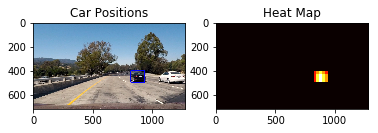

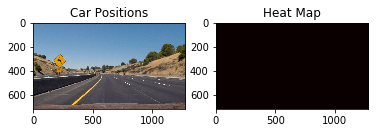

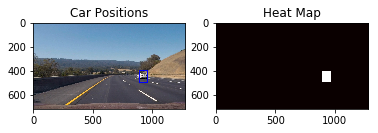

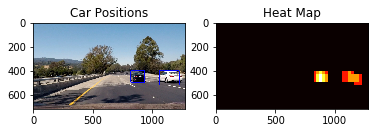

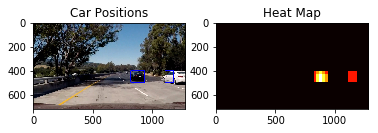

...

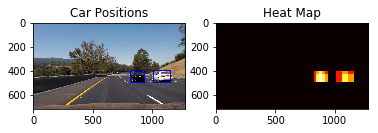

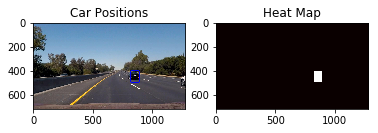

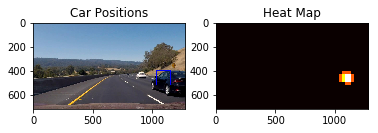

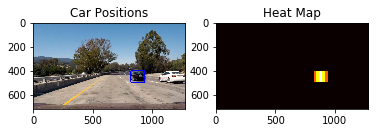

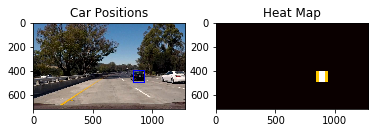

In [21]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap

def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

ystart = 400
ystop = 592
scale = 1.5

for i in range(1,14):
    image = mpimg.imread('test_images/test{0}.jpg'.format(i))
    box_list = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, vis=False)

    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    # Add heat to each box in box list
    add_heat(heat,box_list)

    # Apply threshold to help remove false positives
    apply_threshold(heat,1)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(image), labels)

    fig = plt.figure()
    plt.subplot(121)
    plt.imshow(draw_img)
    plt.title('Car Positions')
    plt.subplot(122)
    #fig = plt.figure()
    plt.imshow(heatmap, cmap='hot')
    plt.title('Heat Map')
    #fig.tight_layout()
    fig.savefig('out_images/hog_sub_samp_test{0}.jpg'.format(i))

### Tracking Pipeline
This is the pipeline implementation for processing a video image end to end using all of the techniques discussed so far.  See writeup.md for full discussion.

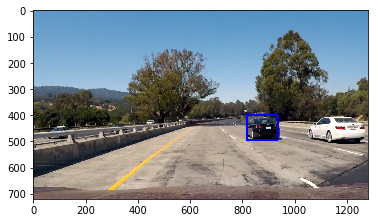

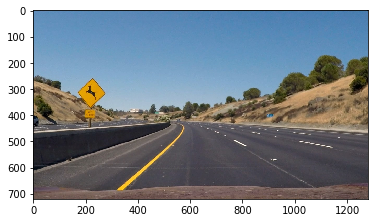

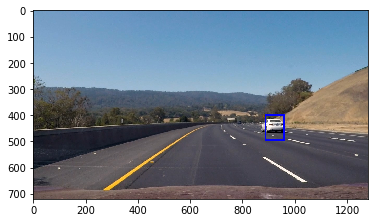

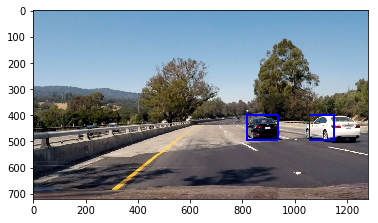

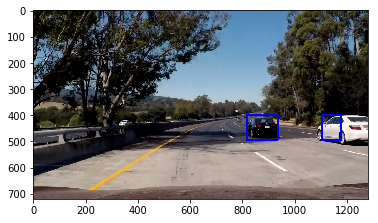

...

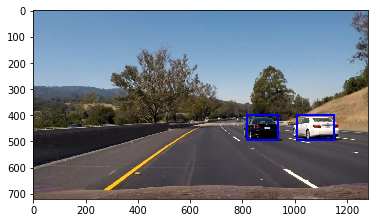

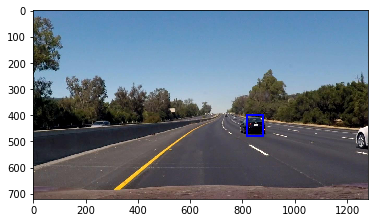

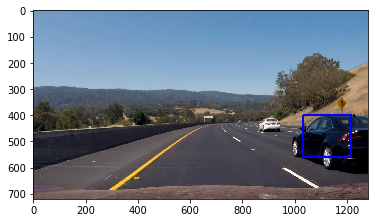

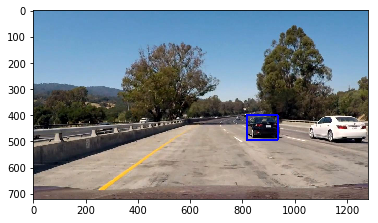

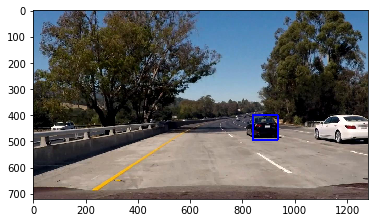

In [22]:
# A class for processing video images taken from a car for the purpose of identifying the cars in the road.
class VehicleDetectionPipeline:
    
    def __init__(self):
        self.hist = []  # contains lists of bounding boxes, one entry per frame
        self.hist_len = 10
        self.heat_thresh = 1
    
    def process(self, image):
        # Conduct search for bounding boxes identifying cars in image
        bboxes = []
        bboxes += find_cars(image, 400, 496, 1.0, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, vis=False)
        bboxes += find_cars(image, 400, 540, 1.5, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, vis=False)
        bboxes += find_cars(image, 432, 624, 2.0, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, vis=False)
        #image = draw_boxes(image, bboxes, color=(0, 0, 255), thick=3)
        
        # Update history with this image's set of bounding boxes
        if len(self.hist) == self.hist_len:
            self.hist = self.hist[1:]
        self.hist.append(bboxes)
        
        # Create a heat map of all frames in history
        heat_map = np.zeros_like(image[:,:,0]).astype(np.float)
        for bbox_list in self.hist:    
            add_heat(heat_map, bbox_list)
        apply_threshold(heat_map, 1 + (len(self.hist) // 3))
        heat_map = np.clip(heat_map, 0, 255)
        
        # Create final image by labeling heat map and drawing bboxes
        labels = label(heat_map)
        out_image = draw_labeled_bboxes(np.copy(image), labels)
        
        return out_image

    
# Create a vehicle pipeline object and test for several test images
for i in range(1,14):
    image = mpimg.imread('test_images/test{0}.jpg'.format(i))
    # Create new instance for each image since the are not sequential frames
    vdp = VehicleDetectionPipeline() 
    out_image = vdp.process(image)
    fig = plt.figure()
    plt.imshow(out_image)
    image = mpimg.imsave('out_images/ppln_test{0}.jpg'.format(i), out_img)

### Test Over Several Sequential Frames

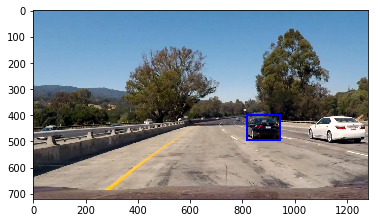

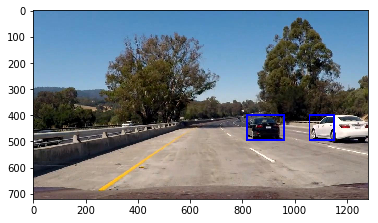

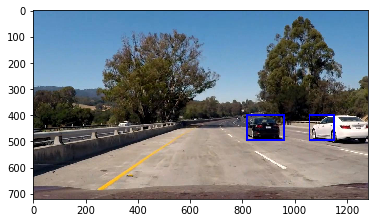

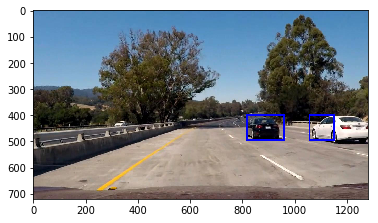

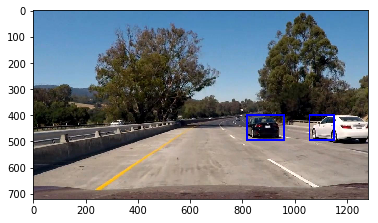

...

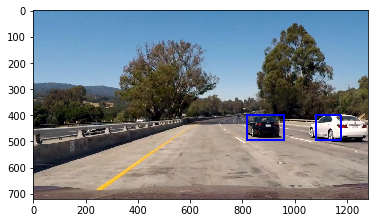

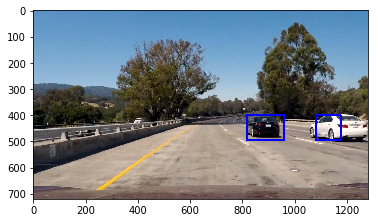

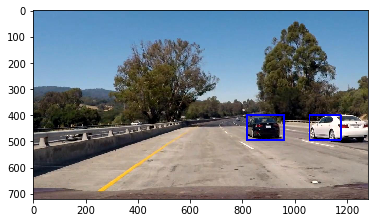

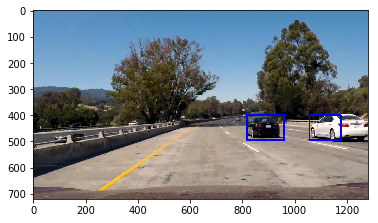

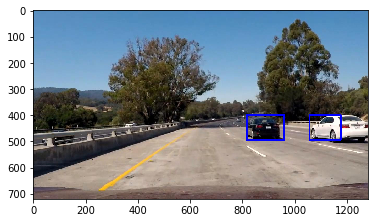

In [12]:
# Run a single instance of VehicleDetectionPipeline for a seconds's worth of sequential frames
vdp = VehicleDetectionPipeline()
i = 1
frames = glob.glob('frames_in/*')
for frame in frames:
    image = mpimg.imread(frame) 
    out_image = vdp.process(image)
    fig = plt.figure()
    plt.imshow(out_image)    
    mpimg.imsave('frames_out/test{0}.jpg'.format(i), out_image)
    i += 1

### Create Video

In [10]:
vdp = VehicleDetectionPipeline()
in_clip = VideoFileClip("project_video.mp4")
out_clip = in_clip.fl_image(vdp.process) #.subclip(20,30)
%time out_clip.write_videofile('project_video_test1.mp4', audio=False)
in_clip.reader.close()
#in_clip.audio.reader.close_proc()

[MoviePy] >>>> Building video project_video_test1.mp4
[MoviePy] Writing video project_video_test1.mp4


100%|█████████████████████████████████████▉| 1260/1261 [12:30<00:00,  1.37it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_test1.mp4 

Wall time: 12min 33s
